In [1]:
import pandas as pd

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [19]:
df = pd.read_csv(r'D:/Hella/demo_4/timestamps.txt', header=None)
# df = pd.read_csv('../timestamps_demo_event.txt', header=None)
# df = pd.read_csv('../timestamps_demo1.txt', header=None)
df.columns = ['timestamp']
print(df.shape)
df.head()

(48000, 1)


,timestamp
0,5867940.5
1,5868222.7
2,5870696.7
3,5873186.0
4,5875694.9


In [20]:
df_diffs = df.diff()
df_diffs.columns = ['frame_diff']
df_diffs

,frame_diff
0,NaN
1,282.2
2,2474.0
3,2489.3
4,2508.9
...,...
47995,2509.0
47996,2625.2
47997,2815.8
47998,3115.1


In [21]:
df_diffs.rolling(window=400).mean()

,frame_diff
0,NaN
1,NaN
2,NaN
3,NaN
4,NaN
...,...
47995,2587.63275
47996,2588.56025
47997,2589.45900
47998,2590.89425


In [22]:
df_diffs.describe()

,frame_diff
count,47999.000000
mean,2537.260808
std,590.962548
min,99.400000
25%,2402.500000
50%,2500.900000
75%,2615.150000
max,33064.300000


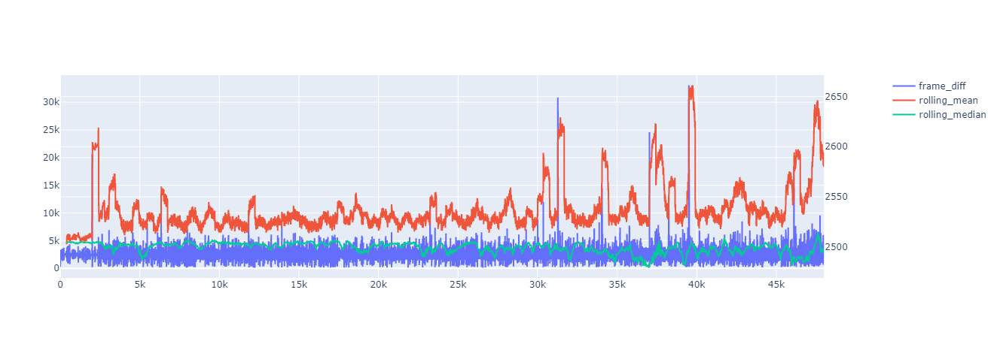

In [23]:
df_diffs['rolling_mean'] = df_diffs.rolling(window=400).frame_diff.mean()
df_diffs['rolling_median'] = df_diffs.rolling(window=400).frame_diff.median()

fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(
    go.Scatter(x=df_diffs.index, y=df_diffs.frame_diff, name='frame_diff'),
    secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=df_diffs.index, y=df_diffs.rolling_mean, name='rolling_mean'),#, opacity=.5),
    secondary_y=True,
)
fig.add_trace(
    go.Scatter(x=df_diffs.index, y=df_diffs.rolling_median, name='rolling_median'),#, opacity=.5),
    secondary_y=True,
)
fig.show()

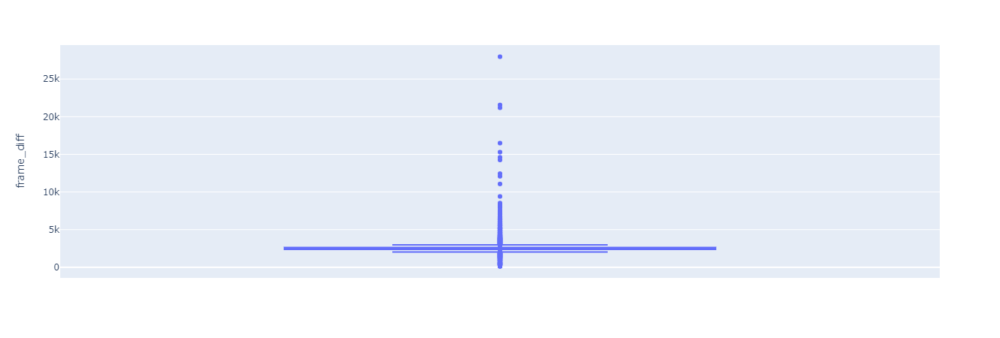

In [13]:
px.box(df_diffs, y='frame_diff')

In [21]:
df_modified = df.copy()
df_modified = df_modified.drop(0).reset_index().rename(columns={'index': 'frame_index'})
df_modified['theoretical_timestamp'] = df_modified.loc[0, 'timestamp'] + ((df_modified['frame_index']-1) * 2500)
df_modified['theoretical_deviation'] = df_modified.timestamp - df_modified.theoretical_timestamp
df_modified

,frame_index,timestamp,theoretical_timestamp,theoretical_deviation
0,1,6810546.4,6810546.4,0.0
1,2,6813165.0,6813046.4,118.6
2,3,6816695.2,6815546.4,1148.8
3,4,6818027.0,6818046.4,-19.4
4,5,6820532.6,6820546.4,-13.8
...,...,...,...,...
47994,47995,128465599.0,126795546.4,1670052.6
47995,47996,128467873.3,126798046.4,1669826.9
47996,47997,128470141.5,126800546.4,1669595.1
47997,47998,128472657.5,126803046.4,1669611.1


In [22]:
(df.iloc[-1].timestamp - df.iloc[0].timestamp)/2500

48666.01784

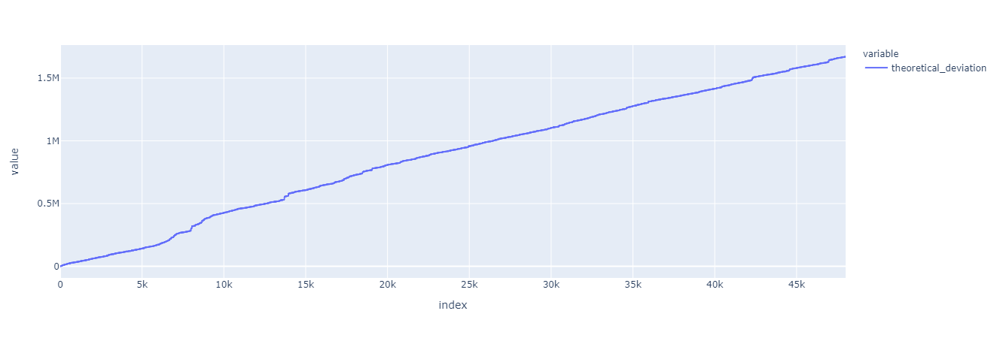

In [23]:
px.line(df_modified.theoretical_deviation)